## Fine-tuning YOLOS on a custom dataset for object detection

In this notebook, we are going to fine-tune YOLOS on a custom object detection dataset. The goal for the model is to recognize balloons in pictures.

* Original YOLOS paper: https://arxiv.org/abs/2106.00666
* Original DETR repo: https://github.com/hustvl/YOLOS

Important note regarding **GPU memory**: `YolosFeatureExtractor` by default resizes each image to have a `min_size` of 800 pixels and a `max_size` of 1333 pixels (as these are the default values that DETR and YOLOS use at *inference* time). Note that this can stress-test the memory of your GPU when *training* the model (the bigger the images, the more patches are used which are sent through the Transformer encoder). It's advised to use a batch size of 2 on a single GPU. You can of course also initialize `YolosFeatureExtractor` with a smaller `size` and/or `max_size` to use bigger batches. 

Note regarding **augmentation**: DETR/YOLOS actually use several image augmentations during training. One of them is **scale augmentation**: they set the `min_size` randomly to be one of [480, 512, 544, 576, 608, 640, 672, 704, 736, 768, 800] as can be seen [here](https://github.com/facebookresearch/detr/blob/a54b77800eb8e64e3ad0d8237789fcbf2f8350c5/datasets/coco.py#L122). However, we are not going to add any of the augmentations that are used in the original implementation during training. It works fine without them.

Also big thanks to the creator of [this notebook](https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb), which helped me a lot in understanding how to fine-tune DETR on a custom dataset.



In [20]:
import torch
torch.set_float32_matmul_precision('medium')
device = "cuda" if torch.cuda.is_available() else "cpu"

## Create PyTorch dataset + dataloaders

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add a feature extractor (`YolosFeatureExtractor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [21]:
import torchvision
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)
        
        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

Based on the class defined above, we create training and validation datasets.

In [22]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OW1WqxqrD1jcDmsC5vMq")
project = rf.workspace("fruitsalat-bjodx").project("fruitsalad-qpmsp")
version = project.version(1)
dataset = version.download("coco")


loading Roboflow workspace...



[notice] A new release of pip available: 22.3.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


loading Roboflow project...


In [23]:
from transformers import AutoFeatureExtractor

feature_extractor = AutoFeatureExtractor.from_pretrained("hustvl/yolos-small", size=512, max_size=864)

train_dataset = CocoDetection(img_folder='FruitSalad-1/train', feature_extractor=feature_extractor)
val_dataset = CocoDetection(img_folder='FruitSalad-1/valid', feature_extractor=feature_extractor, train=False)

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.


loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


As you can see, this dataset is tiny:

In [24]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))

Number of training examples: 7368
Number of validation examples: 701


Let's verify an example by visualizing it. We can access the COCO API of the dataset by typing `train_dataset.coco`. 

Image n°6523
{0: {'id': 0, 'name': 'Fruit', 'supercategory': 'none'}, 1: {'id': 1, 'name': 'Bomb', 'supercategory': 'Fruit'}}


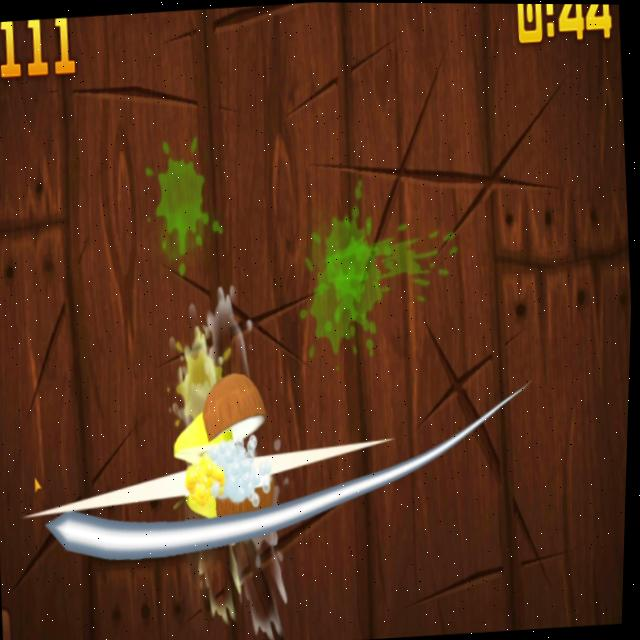

In [25]:
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('FruitSalad-1/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}
print(train_dataset.coco.cats)
for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Next, let's create corresponding dataloaders. We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch.  

In [26]:
from torch.utils.data import DataLoader

def collate_fn(batch, class_label):
  pixel_values = [item[0] for item in batch]
  encoding = feature_extractor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  if class_label != 0: label_list_filter(labels, class_label)
  batch['labels'] = labels
  return batch

def collate_fn0(batch):
    return collate_fn(batch, 0)

def collate_fn1(batch):
    return collate_fn(batch, 1)
    
def collate_fn2(batch):
    return collate_fn(batch, 2)

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn0, batch_size=12)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn0, batch_size=12)
batch = next(iter(train_dataloader))

# train_dataloader1 = DataLoader(train_dataset, collate_fn=collate_fn1, batch_size=1, shuffle=True)
# val_dataloader1 = DataLoader(val_dataset, collate_fn=collate_fn1, batch_size=1)
# train_dataloader2 = DataLoader(train_dataset, collate_fn=collate_fn2, batch_size=1, shuffle=True)
# val_dataloader2 = DataLoader(val_dataset, collate_fn=collate_fn2, batch_size=1)
# batch1 = next(iter(train_dataloader1))
# batch2 = next(iter(train_dataloader2))

In [27]:
print(batch)

{'pixel_values': tensor([[[[-2.0837, -2.0837, -2.0494,  ..., -2.1179, -2.1179, -2.1179],
          [-2.0323, -2.0152, -2.0665,  ..., -2.1179, -2.1179, -2.1179],
          [-2.0152, -1.9638, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.0665, -0.5596, -1.4500],
          [-2.1179, -2.1179, -2.1179,  ..., -1.9809, -1.9467, -2.0152],
          [-2.1179, -2.1179, -2.1179,  ..., -2.0494, -2.0665, -2.0665]],

         [[-2.0007, -2.0007, -1.9657,  ..., -2.0357, -2.0357, -2.0357],
          [-1.9482, -1.9307, -1.9832,  ..., -2.0357, -2.0357, -2.0357],
          [-1.9307, -1.8782, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -1.9832, -0.4426, -1.3529],
          [-2.0357, -2.0357, -2.0357,  ..., -1.8957, -1.8606, -1.9307],
          [-2.0357, -2.0357, -2.0357,  ..., -1.9657, -1.9832, -1.9832]],

         [[-1.7696, -1.7696, -1.7347,  ..., -1.8044, -1.8044, -1.8044],
          [-1

Let's verify the keys of a single batch:

In [28]:
print(batch.keys())

dict_keys(['pixel_values', 'labels'])


In [29]:
# class_labels, boxes, area, iscrowd
def label_list_filter(label_list, class_label):
    for dct in label_list:
        class_labels = dct["class_labels"]
        mask = class_labels == class_label
        dct["class_labels"] = dct["class_labels"][mask]
        dct["boxes"] = dct["boxes"][mask]
        dct["area"] = dct["area"][mask]

Let's verify the shape of the `pixel_values`, and check the `target`::

In [12]:
pixel_values, target = train_dataset[0]

In [13]:
pixel_values.shape

torch.Size([3, 512, 512])

In [14]:
print(target)

{'size': tensor([512, 512]), 'image_id': tensor([0]), 'class_labels': tensor([0]), 'boxes': tensor([[0.3095, 0.2117, 0.1283, 0.1702]]), 'area': tensor([5726.0142]), 'iscrowd': tensor([0]), 'orig_size': tensor([640, 640])}


In [15]:
print(id2label)

{0: 'Fruit', 1: 'Bomb'}


## Train the model using PyTorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters). 

You can of course just train the model in native PyTorch as an alternative.

In [30]:
import pytorch_lightning as pl
from transformers import DetrConfig, AutoModelForObjectDetection
import torch

class Detr(pl.LightningModule):

     def __init__(self, key=0, lr=1e-5, weight_decay=1e-5):
         super().__init__()
         # replace COCO classification head with custom head
         self.model = AutoModelForObjectDetection.from_pretrained("hustvl/yolos-small", 
                                                             num_labels=2,
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.weight_decay = weight_decay
         self.key = key

     def forward(self, pixel_values):
       outputs = self.model(pixel_values=pixel_values)

       return outputs
     
     def common_step(self, batch, key):
        pixel_values = batch["pixel_values"]
        #labels = [{k: (v.to(self.device) if k != "class_labels" else torch.ones(v.shape, dtype=torch.long).to(self.device)) for k, v in t.items()} for t in batch["labels"]]  # todo: train one class at a time?
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]] 
        #print(f"Labels are: {labels}")
        #assert False
        outputs = self.model(pixel_values=pixel_values, labels=labels)
        
        loss = outputs.loss
        loss_dict = outputs.loss_dict
        
        return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.lr,
                                  weight_decay=self.weight_decay)
        
        return optimizer

     def train_dataloader(self):
        return train_dataloader #train_dataloader1 if self.key == 1 else train_dataloader2
     
     def val_dataloader(self):
         return val_dataloader #val_dataloader1 if self.key == 1 else val_dataloader2

In [17]:
len(id2label)

2

As PyTorch Lightning by default logs to Tensorboard, let's start it:

In [18]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir cool/

Launching TensorBoard...

Here we define the model, and verify the outputs.

In [19]:
id2label

{0: 'Fruit', 1: 'Bomb'}

In [20]:
model = Detr(lr=2.5e-5, weight_decay=1e-4, key=1).to(device)
outputs = model(pixel_values=batch['pixel_values'].to(device))
# device = "cuda"
# model1 = Detr(lr=2.5e-5, weight_decay=1e-4, key=1).to(device)
# model2 = Detr(lr=2.5e-5, weight_decay=1e-4, key=2).to(device)
# outputs1 = model1(pixel_values=batch1['pixel_values'].to(device))
# outputs2 = model2(pixel_values=batch2['pixel_values'].to(device))

Some weights of YolosForObjectDetection were not initialized from the model checkpoint at hustvl/yolos-small and are newly initialized because the shapes did not match:
- class_labels_classifier.layers.2.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
- class_labels_classifier.layers.2.weight: found shape torch.Size([92, 384]) in the checkpoint and torch.Size([3, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)


The logits are of shape `(batch_size, num_queries, number of classes + 1)`. We model internally adds an additional "no object class", which explains why we have one additional output for the class dimension. 

In [21]:
outputs.logits.shape

torch.Size([12, 100, 3])

Next, let's train! We train for a maximum of 300 training steps, and also use gradient clipping. You can refresh Tensorboard above to check the various losses.

In [22]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger("cool", name="cool_model")

trainer = Trainer(max_epochs=20, gradient_clip_val=0.2, logger=logger)
trainer.fit(model)
# model1.key = 2
# trainer = Trainer(max_steps=1000, gradient_clip_val=0.1, accumulate_grad_batches=4, logger=logger)
# trainer.fit(model1)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                    | Params | Mode
---------------------------------------------------------
0 | model | YolosForObjectDetection | 30.7 M | eval
---------------------------------------------------------
30.7 M    Trainable params
0         Non-trainable params
30.7 M    Total params
122.602   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

C:\Users\Dontj\Documents\VS_Code\Python\AutoMobileGamePlayingAgent\venv\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
C:\Users\Dontj\Documents\VS_Code\Python\AutoMobileGamePlayingAgent\venv\lib\site-packages\pytorch_lightning\utilities\data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 12. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
C:\Users\Dontj\Documents\VS_Code\Python\AutoMobileGamePlayingAgent\venv\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

C:\Users\Dontj\Documents\VS_Code\Python\AutoMobileGamePlayingAgent\venv\lib\site-packages\pytorch_lightning\trainer\call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...


In [23]:
# from pytorch_lightning import Trainer
# from pytorch_lightning.loggers import TensorBoardLogger
# logger= TensorBoardLogger("cool", name="cool_model2")
# trainer = Trainer(max_steps=300, gradient_clip_val=0.1, accumulate_grad_batches=4, logger=logger)
# trainer.fit(model)

## Evaluate the model

Finally, we evaluate the model on the validation set. The original DETR repo has some nice evaluation tools that we will use.

They are based on the `CocoEvaluator` class from torchvision, which in turn is based on [this](https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/cocoeval.py).

Let's first load the ground truth COCO dataset:

In [31]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

Let's run the evaluation:

In [39]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

iou_types = ['bbox']
coco_evaluator = CocoEvaluator(coco_gt=val_dataset.coco, iou_types=iou_types) # initialize evaluator with ground truths

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Detr.load_from_checkpoint("cool/cool_model/version_5/checkpoints/epoch=19-step=3080.ckpt").to(device)
model.to(device)
model.eval()

print("Running evaluation...")

for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    outputs = model.model(pixel_values=pixel_values)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = feature_extractor.post_process(outputs, orig_target_sizes) # convert outputs of model to COCO api
    res = {target['image_id'].item(): output for target, output in zip(labels, results)}
    print(res)
    
    res = prepare_for_coco_detection(res)
    coco_evaluator.update(res)

coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

Some weights of YolosForObjectDetection were not initialized from the model checkpoint at hustvl/yolos-small and are newly initialized because the shapes did not match:
- class_labels_classifier.layers.2.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
- class_labels_classifier.layers.2.weight: found shape torch.Size([92, 384]) in the checkpoint and torch.Size([3, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Running evaluation...


  0%|          | 0/59 [00:00<?, ?it/s]

{0: {'scores': tensor([3.2465e-06, 3.5902e-05, 2.8301e-05, 2.7756e-05, 2.0451e-05, 2.1230e-05,
        3.7125e-06, 4.4248e-05, 5.7962e-06, 3.8828e-06, 2.5740e-06, 4.9909e-06,
        1.9005e-05, 5.4988e-05, 3.2639e-05, 7.4660e-05, 1.9973e-05, 1.2193e-05,
        2.4619e-05, 1.7673e-06, 5.0426e-06, 1.3773e-05, 1.5321e-05, 3.8379e-04,
        2.0093e-05, 2.0728e-05, 3.0931e-06, 6.6999e-05, 1.3486e-04, 1.6943e-05,
        2.2310e-05, 2.4209e-05, 9.9888e-05, 1.1045e-05, 9.6799e-06, 9.7164e-06,
        2.7941e-05, 2.1546e-05, 1.8063e-04, 1.2269e-04, 3.1717e-05, 2.8688e-05,
        2.5946e-06, 1.1214e-05, 4.1465e-05, 2.6527e-06, 1.7721e-05, 2.0180e-05,
        1.0643e-05, 2.5436e-06, 5.1512e-05, 8.6184e-05, 1.0486e-05, 3.0847e-06,
        1.0833e-04, 6.3355e-05, 1.1470e-04, 7.7784e-05, 2.3304e-06, 1.6786e-05,
        1.0656e-05, 1.6411e-05, 7.3984e-05, 1.6001e-05, 8.4328e-05, 2.4457e-05,
        1.9186e-05, 5.5911e-05, 1.7029e-06, 1.1424e-05, 4.8351e-06, 2.7489e-05,
        3.5772e-05, 8.393

In [33]:
print(val_dataset.coco.getImgIds())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

## Inference (+ visualization)

Let's visualize the predictions of DETR on the first image of the validation set.

In [34]:
import torch
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        print(f"Class: {cl}")
        text = f'{id2label[cl.item()]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

def visualize_predictions(image, outputs, threshold=0.8):
    t = time.perf_counter()
    print(outputs.logits)
    # keep only predictions with confidence >= threshold
    probas = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold
    print(outputs.logits.softmax(-1)[0, :, :-1])
    # convert predicted boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)
    print(bboxes_scaled)
    ret = time.perf_counter() - t
    # plot results
    plot_results(image, probas[keep], bboxes_scaled)
    return ret

In [35]:
times = []
times2 = []
for pixel_values, target in val_dataset:
    #We can use the image_id in target to know which image it is
    pixel_values = pixel_values.unsqueeze(0).to(device)
    #print(pixel_values.shape)
    # forward pass to get class logits and bounding boxes
    model = model.to(device)
    import time
    t = time.perf_counter()
    outputs = model(pixel_values=pixel_values)
    timeTaken = time.perf_counter() - t
    print(f"Inference took {timeTaken} seconds")
    times.append(timeTaken)
    image_id = target['image_id'].item()
    image = val_dataset.coco.loadImgs(image_id)[0]
    image = Image.open(os.path.join('dataset/images/val', image['file_name']))
    
    t2 = visualize_predictions(image, outputs, 0.9)
    print(f"BBox time took {t2}")
    times2.append(t2)
print(times, times2)

Inference took 0.012548699975013733 seconds


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\Dontj\\Documents\\VS_Code\\Python\\detr\\environment\\fruit_ninja_detr\\dataset\\images\\val\\frame392_jpg.rf.011cf0d8230c37f7d8bf72b99c949140.jpg'

Inference took 0.13209359999746084 seconds
tensor([[[-5.0828, -8.4562,  9.1268],
         [-4.4559, -3.3233,  5.7245],
         [-2.9530, -6.3224,  5.5687],
         [-4.2958, -3.3793,  5.5868],
         [-4.4075, -3.9731,  6.1830],
         [-5.1321, -6.8447,  7.8540],
         [-4.3597, -9.0220,  8.7855],
         [-2.2713, -4.0934,  3.3034],
         [-4.6539, -5.5152,  7.0087],
         [-4.1945, -9.7581,  9.1976],
         [-3.8034, -6.2261,  5.8865],
         [-4.1735, -4.5586,  6.0285],
         [-4.6480, -3.8983,  6.1538],
         [-1.9053, -4.0359,  3.2265],
         [-4.6489, -3.4107,  5.9544],
         [-3.3519, -7.4729,  6.3465],
         [-4.3286, -3.8364,  5.8273],
         [-3.7670, -4.7666,  5.7269],
         [-4.8298, -3.0787,  5.7481],
         [-4.5554, -8.2928,  8.1949],
         [-4.0597, -6.2173,  6.3087],
         [-3.1382, -4.8020,  5.0829],
         [-3.9085, -4.2611,  5.5617],
         [-4.3697, -3.2009,  5.2864],
         [-4.7921, -8.6352,  8.9471],
       

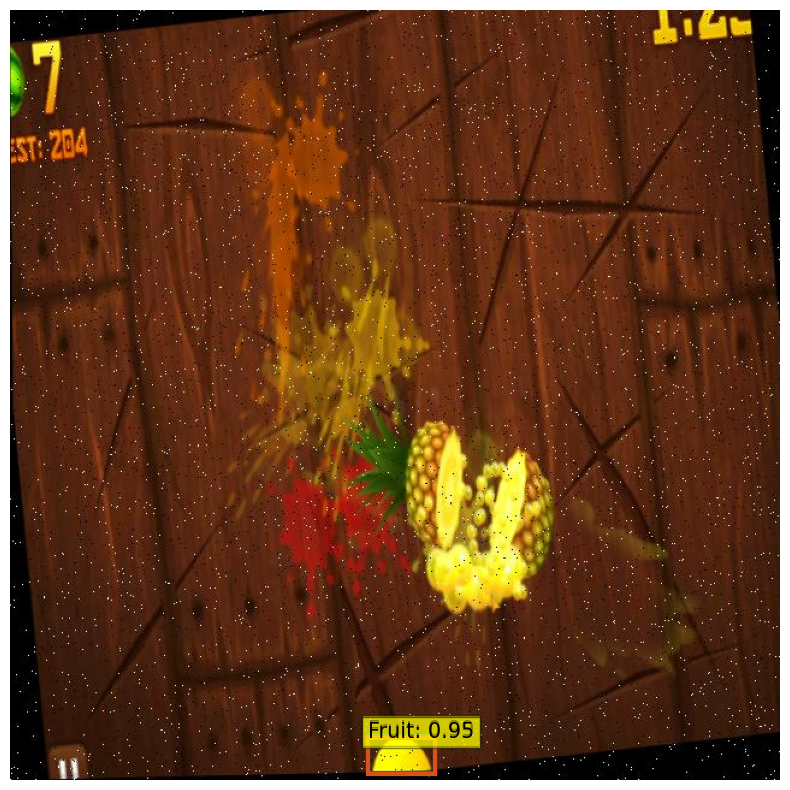

0.1439568999921903

In [36]:
#We can use the image_id in target to know which image it is
pixel_values, target = train_dataset[21]
pixel_values = pixel_values.unsqueeze(0).to(device)
#print(pixel_values.shape)
# forward pass to get class logits and bounding boxes
model = model.to(device)
import time
t = time.perf_counter()
outputs = model(pixel_values=pixel_values)
print(f"Inference took {time.perf_counter() - t} seconds")
image_id = target['image_id'].item()
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('FruitSalad-1/train', image['file_name']))

visualize_predictions(image, outputs, 0.9)

In [ ]:
id2label

In [ ]:
print(pixel_values.shape)

In [ ]:
im = image.resize((512, 672))
imarr = np.array(im) / 255
t = torch.from_numpy(imarr).float().cuda()
t = t.permute(2, 0, 1).unsqueeze(0)  # add dim 1 to first axis because we need batch size
out = model(pixel_values=t)
visualize_predictions(image, out)

In [ ]:
import PIL
img = (pixel_values.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
imageimg = PIL.Image.fromarray(img)
imageimg

In [ ]:
import json
with open("dataset/custom_train.json", "r") as f:
    js = json.load(f)
ret = []
for im in js["images"]:
    ret.append(im["path"].replace(".png", ""))

In [ ]:
t.shape

In [ ]:
ret = [int(k) for k in ret]
ret = list(sorted(ret))

In [ ]:
ret

In [ ]:
folder = set(range(100))
remove = {0, 11, 44, 51, 58, 64}
folder2 = folder - remove
print(len(folder2))

In [ ]:
to_add = folder2 - set(ret)
to_add

In [37]:
def get_bboxes(path, model_, threshold=0.9):
    im = Image.open(path)
    px_values_unbatched = torch.from_numpy(feature_extractor(im)["pixel_values"][0])
    ret = model_(px_values_unbatched.unsqueeze(0).to(device))
    
    probas = ret.logits.softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold
    # convert predicted boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(ret.pred_boxes[0, keep].cpu(), image.size).cpu().tolist()
    im.close()
    return post_process_bbox(bboxes_scaled)

def post_process_bbox(bbox_list: list):
    ret = []
    while bbox_list:
        top = bbox_list.pop()
        bbox_list = [r for r in bbox_list if rect_intersect(top, r) is None]  # any intersect means not in list
        ret.append(top)
    return ret

def rect_intersect(r1, r2):
    x1, y1, x2, y2 = r1
    x3, y3, x4, y4 = r2
    x5 = max(x1, x3)
    y5 = max(y1, y3)
    x6 = min(x2, x4)
    y6 = min(y2, y4)
    if x6 < x5 or y6 < y5:
        return None
    return (x5, y5, x6, y6)

Some weights of YolosForObjectDetection were not initialized from the model checkpoint at hustvl/yolos-small and are newly initialized because the shapes did not match:
- class_labels_classifier.layers.2.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
- class_labels_classifier.layers.2.weight: found shape torch.Size([92, 384]) in the checkpoint and torch.Size([3, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tensor([[[-3.3089, -4.3248,  5.0426],
         [-4.3108, -3.2731,  5.5486],
         [-3.2836, -4.1591,  4.6571],
         [-3.6946, -4.0495,  5.0776],
         [-4.4700, -3.5229,  5.8121],
         [-4.1177, -4.3498,  5.6245],
         [-1.5449, -5.2898,  3.9723],
         [-2.3727, -4.0071,  3.6139],
         [-4.1095, -3.4721,  5.0659],
         [-2.6321, -3.9722,  4.1191],
         [-1.8412, -5.0349,  4.1761],
         [-4.0159, -3.5264,  4.9054],
         [-4.3721, -3.5090,  5.7645],
         [-2.2088, -3.9708,  3.5641],
         [-4.2431, -3.4937,  5.6084],
         [-2.5602, -4.8719,  4.0497],
         [-4.1759, -3.4890,  5.5163],
         [-3.3998, -4.7908,  5.3215],
         [-4.5762, -3.3973,  5.8512],
         [-3.2694, -4.4028,  4.8892],
         [-1.8151, -4.8896,  3.8442],
         [-3.6136, -4.6335,  5.3666],
         [-2.7826, -4.2193,  4.3301],
         [-4.5170, -3.7672,  5.6262],
         [-1.7699, -4.6160,  3.7363],
         [-4.5333, -3.5591,  5.9539],
         [-0

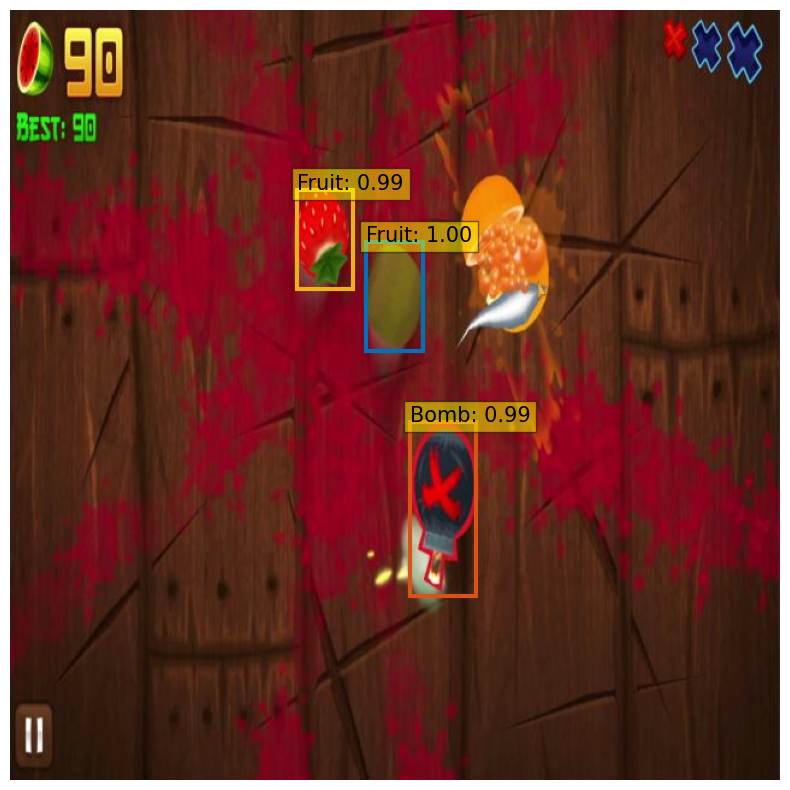

0.25326480000512674

In [38]:
model = Detr.load_from_checkpoint("cool/cool_model/version_5/checkpoints/epoch=19-step=3080.ckpt").to(device)
model.eval()
im = Image.open("FruitSalad-1/test/frame122_jpg.rf.b41d93995ec5bda850be3cb38b2a9ebe.jpg")
visualize_predictions(im, model(pixel_values = torch.from_numpy(feature_extractor(im)["pixel_values"][0]).unsqueeze(0).to(device)))

In [ ]:
im = Image.open("dataset/images/train/5.png")
visualize_predictions(im, model(pixel_values = torch.from_numpy(feature_extractor(im)["pixel_values"][0]).unsqueeze(0).to(device)))

In [ ]:
feature_extractor(im)["pixel_values"][0].shape

In [ ]:
API_KEY_ENV_NAMES = ["ROBOFLOW_API_KEY", "API_KEY"]
API_KEY = os.getenv(API_KEY_ENV_NAMES[0], None)
print(API_KEY)

In [ ]:
import inference
model = inference.get_model("flappy-bird-swb9x/2")

model.infer(image="YOUR_IMAGE.jpg")